In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, chirp
from scipy import integrate
import matplotlib.animation as animation
from IPython import display

In [2]:
def calc_force(source_pos,particle_pos):
    
    ax = 0
    ay = 0
    for i in range(0,source_pos.shape[0]):
#         print(i)
        
        rx = (source_pos[i,0]-particle_pos[0])
        ry = (source_pos[i,1]-particle_pos[1])
        r = np.sqrt(rx**2+ry**2)

        if r>0:
            ax += (1/r**2)*rx/r
            ay += (1/r**2)*ry/r
            
        else:
            ax += 0
            ay += 0
        
        a = np.sqrt(ax**2+ay**2)
            
            
    return a,ax,ay

def calc_force_gravity_like(source_pos,particle_pos):
    
    ax = 0
    ay = 0
    for i in range(0,source_pos.shape[0]):
#         print(i)
        
        rx = (source_pos[i,0]-particle_pos[0])
        ry = (source_pos[i,1]-particle_pos[1])
        r = np.sqrt(rx**2+ry**2)

        if np.abs(r)>1e-10:
#             ax += np.exp(-0.07*r**2)*rx
#             ay += np.exp(-0.07*r**2)*ry
            ax += np.tanh(r**2)*rx/(r**2)
            ay += np.tanh(r**2)*ry/(r**2)
            
        else:
            ax += 0
            ay += 0
        
        a = np.sqrt(ax**2+ay**2)
#         print(a)    
            
    return a,ax,ay

def calc_force_lorentz_like(source_pos,particle_pos):
    
    ax = 0
    ay = 0
    for i in range(0,source_pos.shape[0]):
#         print(i)
        
        rx = (source_pos[i,0]-particle_pos[0])
        ry = (source_pos[i,1]-particle_pos[1])
        r = np.sqrt(rx**2+ry**2)
        
        rhatx = rx/r
        rhaty = ry/r
        
        rx_rot = -rhaty
        ry_rot = rhatx

        if np.abs(r)>1e-10:
#             ax += np.exp(-0.07*r**2)*rx
#             ay += np.exp(-0.07*r**2)*ry
#             ax += (1/r**2)*rx_rot
#             ay += (1/r**2)*ry_rot
            w = 2*np.pi/100
            ax += rx*w**2
            ay += ry*w**2
#             ax += -np.tanh(r**2)*ry/(r**2)
#             ay += np.tanh(r**2)*rx/(r**2)
            
        else:
            ax += 0
            ay += 0
        
        a = np.sqrt(ax**2+ay**2)
#         print(a)    
            
    return a,ax,ay


def rhs_RK(t,X,s_pos):
    
    rx = X[0]
    ry = X[1]
    vx = X[2]
    vy = X[3]
    
    r = np.sqrt(rx**2+ry**2)
#     a,ax,ay = calc_force(s_pos,np.array([rx,ry]))
#     a,ax,ay = calc_force_damp(s_pos,np.array([rx,ry]),np.array([vx,vy]))
    a,ax,ay = calc_force_gravity_like(s_pos,np.array([rx,ry]))
#     a,ax,ay = calc_force_lorentz_like(s_pos,np.array([rx,ry]))
    
    drx_dt = vx
    dry_dt = vy
    dvx_dt = ax-vx
    dvy_dt = ay-vy
    
#     print(rx,ay,ry,ax)
#     dsource_dt = np.array
#     print(rx,ry,v0x,v0y)
#     return
    return drx_dt,dry_dt,dvx_dt,dvy_dt


def simple_RK(t,y):
    
    dydt = 10
    
    return dydt

The solver successfully reached the end of the integration interval.


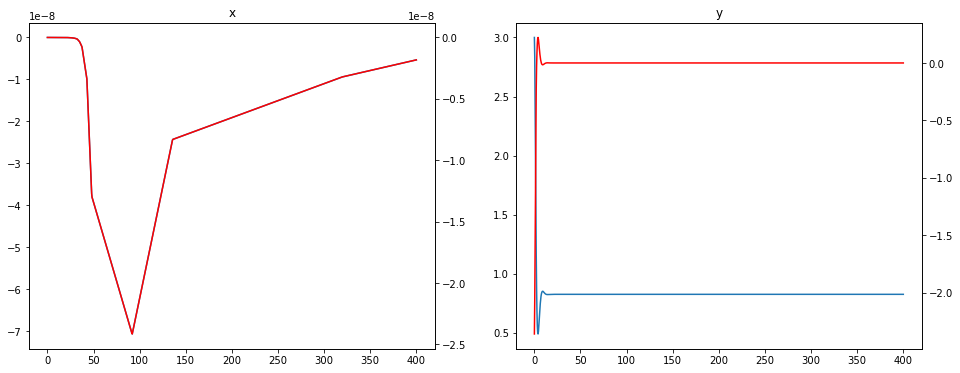

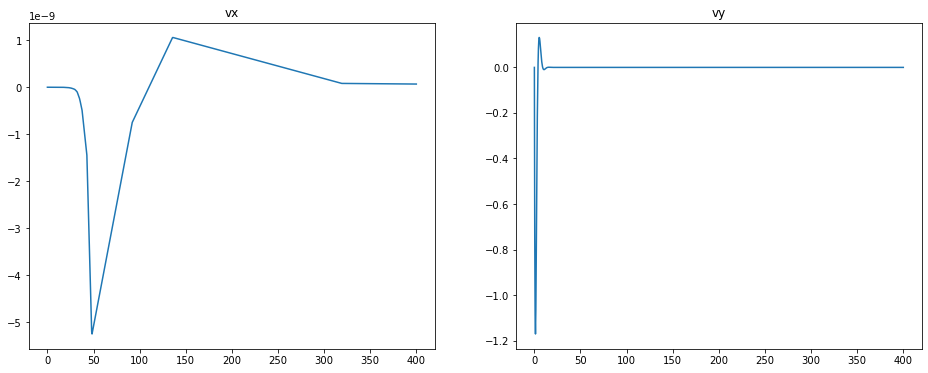

In [3]:
# source_pos = np.array([[0,-5],[0,5]])

n = 41
x = np.linspace(-10,10,n)
# y = 10*(1)**np.abs(x)
y = 3*np.cos(2*np.pi/5*x)+np.cos(2*np.pi/20*x)
x = np.reshape(x,(n,1))
y = np.reshape(y,(n,1))

xy = np.append(x,y,axis=1)
# xy2 = np.append(x,-y,axis=1)
# xy = np.append(xy,xy2,axis=0)
source_pos = xy
# print(xy)


# source_pos = np.array([[-1,-1],[-1,1],[1,1],[1,-1]])*0.5

# source_pos = np.array([0,0]),
# source_pos = np.reshape(source_pos,(1,2))
# source_x = source_pos[0,0]
# source_y = source_pos[0,0]


# particle_pos = np.array([10,-1])
# particle_x = 5
# particle_y = 0

v0 = np.array([0,0])

# a,ax,ay = calc_force(source_pos,particle_pos)

# initial_cond = np.append(particle_pos,v0)
# rhs_RK(0,initial_cond,source_pos)


# integrate.RK45(rhs_RK(t,y,source_pos), 0, initial_cond, 1, max_step=inf, rtol=0.001, atol=1e-06,vectorized=False, first_step=None, **extraneous)

# t = 0
nt = 1001
t_eval = np.linspace(0, 400, nt)

sol = integrate.solve_ivp(rhs_RK, [0, nt], [0,3,0,0],method = 'LSODA', t_eval=t_eval, args=[source_pos])
print(sol.message)
t_sol = sol.t
x_sol = sol.y[0,:]
y_sol = sol.y[1,:]
vx_sol = sol.y[2,:]
vy_sol = sol.y[3,:]

# plt.plot(t_sol,np.abs(x_sol))

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))
ax1.plot(t_sol,x_sol)
ax1.title.set_text('x')
ax2.plot(t_sol,y_sol)
ax2.title.set_text('y')

fig2, (ax12,ax22) = plt.subplots(1,2,figsize=(16,6))
ax12.plot(t_sol,vx_sol)
ax12.title.set_text('vx')
ax22.plot(t_sol,vy_sol)
ax22.title.set_text('vy')

# print(x_sol[-1])

ax = np.zeros(np.shape(t_sol))
ay = np.zeros(np.shape(t_sol))
for i in range(0,len(t_sol)):
    a,ax[i],ay[i] = calc_force_gravity_like(source_pos,np.array([x_sol[i],y_sol[i]]))
    
# fig3, (ax13,ax23) = plt.subplots(1,2,figsize=(16,6))
ax31 = ax1.twinx()
ax32 = ax2.twinx()

ax31.plot(t_sol,ax ,color='r')
# ax31.title.set_text('ax')
ax32.plot(t_sol,ay,color='r')
# ax32.title.set_text('ay')
    


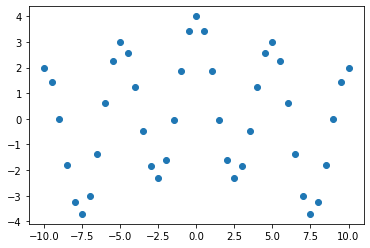

In [4]:
# x = np.linspace(-10,10,201)
# y1 = 1/(x**2)
# y2 = np.tanh(x**3)/x#np.exp(-0.01*x**2)*x
# y3 = np.tanh(0.5*x**3)/x#np.exp(-0.01*x**2)*x

# # plt.plot(x,y1)
# plt.plot(x,y2)
# plt.plot(x,y3)

#
# plt.plot(source_pos[:,0],source_pos[:,1],marker='o',linestyle='')

# print(y1[-1],y2[-1])

# print(source_pos)
# print(particle_pos)
# print(calc_force(source_pos,particle_pos))
# print(calc_force_gauss(source_pos,particle_pos))


# print(np.tanh(1e-308))

# print(source_pos)

In [10]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))

dot1, = ax1.plot(source_pos[:,0],source_pos[:,1],marker='o')
dot2, = ax1.plot(x_sol[0],y_sol[0],marker='o',color='r')


ax1.set_xlim(np.min([np.min(source_pos[:,0]),x_sol.min()]),np.max([np.max(source_pos[:,0]),x_sol.max()]))
ax1.set_ylim(np.min([np.min(source_pos[:,1]),y_sol.min()]),np.max([np.max(source_pos[:,1]),y_sol.max()]))
ax1.grid()

ax2.set_xlim(-11,11)
ax2.set_ylim(-11,11)
ax2.grid()

def animate(i):
        
#     print(x_t[i])
    dot2.set_xdata(x_sol[i])
    dot2.set_ydata(y_sol[i])  # update the data.
    
    return dot2,

# framelength = len(x_sol)
framelength = 200

ani = animation.FuncAnimation(
    fig, animate, interval=50, blit=True, frames=framelength)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

html= display.HTML(ani.to_jshtml())
display.display(html)

plt.close()